In [67]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
from skimpy import skim
import plotly.express as px
from wordcloud import WordCloud

# import du fichier

In [113]:
df = pd.read_csv('movie_metadata.csv') 
df

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000
4,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5038,Color,Scott Smith,1.0,87.0,2.0,318.0,Daphne Zuniga,637.0,NaN,Comedy|Drama,...,6.0,English,Canada,NaN,NaN,2013.0,470.0,7.7,NaN,84
5039,Color,NaN,43.0,43.0,NaN,319.0,Valorie Curry,841.0,NaN,Crime|Drama|Mystery|Thriller,...,359.0,English,USA,TV-14,NaN,NaN,593.0,7.5,16.00,32000
5040,Color,Benjamin Roberds,13.0,76.0,0.0,0.0,Maxwell Moody,0.0,NaN,Drama|Horror|Thriller,...,3.0,English,USA,NaN,1400.0,2013.0,0.0,6.3,NaN,16
5041,Color,Daniel Hsia,14.0,100.0,0.0,489.0,Daniel Henney,946.0,10443.0,Comedy|Drama|Romance,...,9.0,English,USA,PG-13,NaN,2012.0,719.0,6.3,2.35,660


In [3]:
# changement dans la colonne movie title.
df['movie_title'] = df['movie_title'].str.rstrip('\xa0')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5043 entries, 0 to 5042
Data columns (total 28 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   color                      5024 non-null   object 
 1   director_name              4939 non-null   object 
 2   num_critic_for_reviews     4993 non-null   float64
 3   duration                   5028 non-null   float64
 4   director_facebook_likes    4939 non-null   float64
 5   actor_3_facebook_likes     5020 non-null   float64
 6   actor_2_name               5030 non-null   object 
 7   actor_1_facebook_likes     5036 non-null   float64
 8   gross                      4159 non-null   float64
 9   genres                     5043 non-null   object 
 10  actor_1_name               5036 non-null   object 
 11  movie_title                5043 non-null   object 
 12  num_voted_users            5043 non-null   int64  
 13  cast_total_facebook_likes  5043 non-null   int64

In [ ]:
#calcule des données manquantes

In [5]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'percent_missing': percent_missing})

In [6]:
missing_value_df

,percent_missing
color,0.376760
director_name,2.062265
num_critic_for_reviews,0.991473
duration,0.297442
director_facebook_likes,2.062265
actor_3_facebook_likes,0.456078
actor_2_name,0.257783
actor_1_facebook_likes,0.138806
gross,17.529248
genres,0.000000


In [ ]:
#observer si presence de duplication

In [7]:
df.duplicated().sum()

45

In [8]:
df[df.duplicated]

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
137,Color,David Yates,248.0,110.0,282.0,103.0,Alexander Skarsgård,11000.0,124051759.0,Action|Adventure|Drama|Romance,...,239.0,English,USA,PG-13,180000000.0,2016.0,10000.0,6.6,2.35,29000
187,Color,Bill Condon,322.0,115.0,386.0,12000.0,Kristen Stewart,21000.0,292298923.0,Adventure|Drama|Fantasy|Romance,...,329.0,English,USA,PG-13,120000000.0,2012.0,17000.0,5.5,2.35,65000
204,Color,Hideaki Anno,1.0,120.0,28.0,12.0,Shin'ya Tsukamoto,544.0,NaN,Action|Adventure|Drama|Horror|Sci-Fi,...,13.0,Japanese,Japan,NaN,NaN,2016.0,106.0,8.2,2.35,0
303,Color,Joe Wright,256.0,111.0,456.0,394.0,Cara Delevingne,20000.0,34964818.0,Adventure|Family|Fantasy,...,186.0,English,USA,PG,150000000.0,2015.0,548.0,5.8,2.35,24000
389,Color,Josh Trank,369.0,100.0,128.0,78.0,Reg E. Cathey,596.0,56114221.0,Action|Adventure|Sci-Fi,...,695.0,English,USA,PG-13,120000000.0,2015.0,360.0,4.3,2.35,41000
395,Color,Rob Cohen,187.0,106.0,357.0,4000.0,Vin Diesel,23000.0,144512310.0,Action|Crime|Thriller,...,988.0,English,USA,PG-13,38000000.0,2001.0,14000.0,6.7,2.35,14000
590,Color,Brett Ratner,245.0,101.0,420.0,467.0,Rufus Sewell,12000.0,72660029.0,Action|Adventure,...,269.0,English,USA,PG-13,100000000.0,2014.0,3000.0,6.0,2.35,21000
656,Color,Paul Verhoeven,196.0,113.0,719.0,217.0,Rachel Ticotin,605.0,119412921.0,Action|Sci-Fi,...,391.0,English,USA,R,65000000.0,1990.0,308.0,7.5,1.85,0
794,Color,Joss Whedon,703.0,173.0,0.0,19000.0,Robert Downey Jr.,26000.0,623279547.0,Action|Adventure|Sci-Fi,...,1722.0,English,USA,PG-13,220000000.0,2012.0,21000.0,8.1,1.85,123000
1220,Color,Angelina Jolie Pitt,322.0,137.0,11000.0,465.0,Jack O'Connell,769.0,115603980.0,Biography|Drama|Sport|War,...,351.0,English,USA,PG-13,65000000.0,2014.0,698.0,7.2,2.35,35000


il ne semle pas y avoir de vrai dupliqué. 

In [9]:
#test de la librairue skimpy
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 5043   │ │ float64     │ 13    │                                                          │
│ │ Number of columns │ 28     │ │ string      │ 12    │                                                          │
│ └───────────────────┴────────┘ │ int64       │ 3     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━┳━━━━━┳━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━┳━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_na ┃     ┃       ┃          ┃           ┃      ┃         ┃          ┃          ┃           ┃        ┃  │
│ ┃ me        ┃ NA  ┃ NA %  ┃ mean     ┃ sd        ┃ p0   ┃ p25     ┃ p50      ┃ p75      ┃ p100      ┃ hist   ┃  │
│ ┡━━━━━━━━━━━╇━━━━━╇━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━╇━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━┩  │
│ │ num_criti │  50 │  0.99 │      140 │       120 │    1 │      50 │      110 │      200 │       810 │  ▇▃▁   │  │
│ │ c_for_rev │     │       │          │           │      │         │          │          │           │        │  │
│ │ iews      │     │       │          │           │      │         │          │          │           │        │  │
│ │ duration  │  15 │   0.3 │      110 │        25 │    7 │      93 │      100 │      120 │       510 │   ▂▇   │  │
│ │ director_ │ 104 │  2.06 │      690 │      2800 │    0 │       7 │       49 │      190 │     23000 │   ▇    │  │
│ │ facebook_ │     │       │          │           │      │         │          │          │           │        │  │
│ │ likes     │     │       │          │           │      │         │          │          │           │        │  │
│ │ actor_3_f │  23 │  0.46 │      650 │      1700 │    0 │     130 │      370 │      640 │     23000 │   ▇    │  │
│ │ acebook_l │     │       │          │           │      │         │          │          │           │        │  │
│ │ ikes      │     │       │          │           │      │         │          │          │           │        │  │
│ │ actor_1_f │   7 │  0.14 │     6600 │     15000 │    0 │     610 │      990 │    11000 │    640000 │   ▇    │  │
│ │ acebook_l │     │       │          │           │      │         │          │          │           │        │  │
│ │ ikes      │     │       │          │           │      │         │          │          │           │        │  │
│ │ gross     │ 884 │ 17.53 │ 48000000 │  68000000 │  160 │ 5300000 │ 26000000 │ 62000000 │ 760000000 │   ▇▁   │  │
│ │ num_voted │   0 │     0 │    84000 │    140000 │    5 │    8600 │    34000 │    96000 │   1700000 │   ▇    │  │
│ │ _users    │     │       │          │           │      │         │          │          │           │        │  │
│ │ cast_tota │   0 │     0 │     9700 │     18000 │    0 │    1400 │     3100 │    14000 │    660000 │   ▇    │  │
│ │ l_faceboo │     │       │          │           │      │         │          │          │           │        │  │
│ │ k_likes   │     │       │          │           │      │         │          │          │           │        │  │
│ │ facenumbe │  13 │  0.26 │      1.4 │         2 │    0 │       0 │        1 │        2 │        43 │   ▇    │  │
│ │ r_in_post │     │       │          │           │    

In [10]:
for col in df.columns:
    print(df[col].value_counts())
    
    

color
Color               4815
 Black and White     209
Name: count, dtype: int64
director_name
Steven Spielberg    26
Woody Allen         22
Clint Eastwood      20
Martin Scorsese     20
Ridley Scott        17
                    ..
John Crowley         1
Rob Pritts           1
David S. Ward        1
R.J. Cutler          1
Daniel Hsia          1
Name: count, Length: 2398, dtype: int64
num_critic_for_reviews
1.0      43
9.0      37
5.0      36
10.0     35
8.0      35
         ..
738.0     1
476.0     1
775.0     1
552.0     1
409.0     1
Name: count, Length: 528, dtype: int64
duration
90.0     161
100.0    141
101.0    139
98.0     135
97.0     131
        ... 
236.0      1
334.0      1
270.0      1
227.0      1
47.0       1
Name: count, Length: 191, dtype: int64
director_facebook_likes
0.0      907
3.0       70
6.0       66
7.0       64
2.0       63
        ... 
593.0      1
434.0      1
482.0      1
667.0      1
291.0      1
Name: count, Length: 435, dtype: int64
actor_3_facebook_lik

In [ ]:
#Analyse grace a des Worldcloud

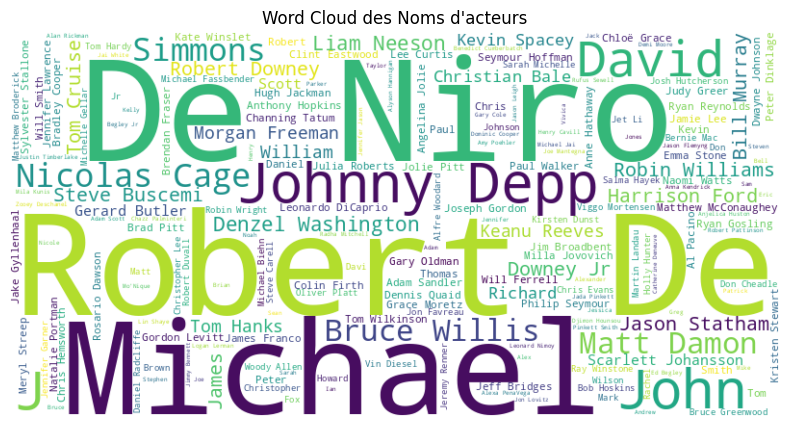

In [68]:
# Concaténer les noms des acteurs en une seule chaîne
actor_names = ' '.join(df['actor_1_name'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(actor_names)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud des Noms d\'acteurs')
plt.show()

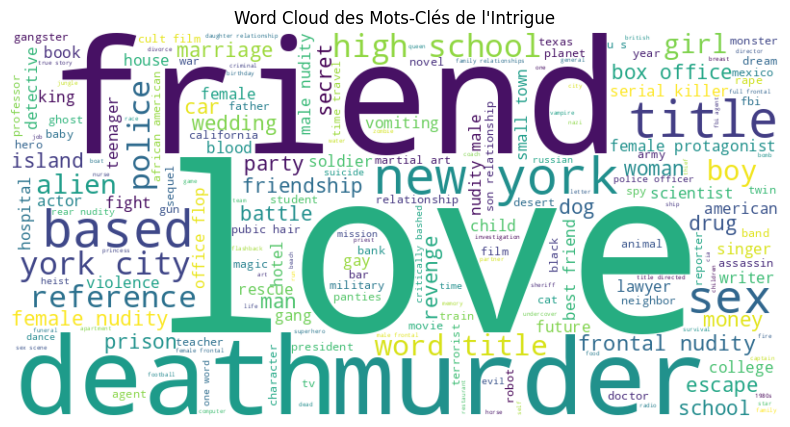

In [69]:
plot_keywords = ' '.join(df['plot_keywords'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(plot_keywords)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud des Mots-Clés de l\'Intrigue')
plt.show()

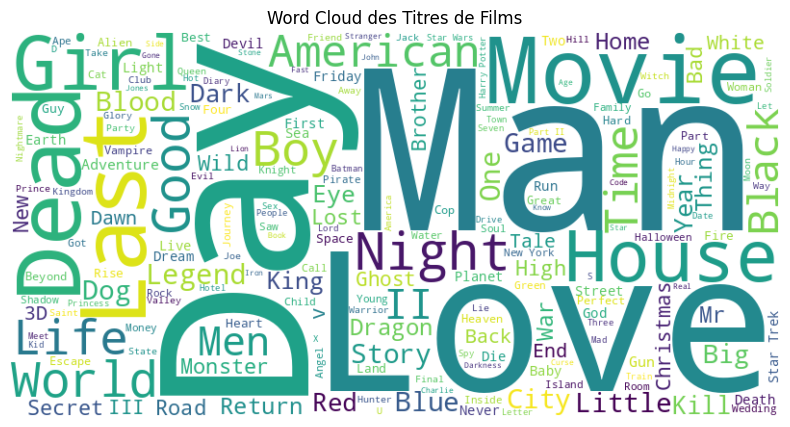

In [70]:
movie_titles = ' '.join(df['movie_title'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(movie_titles)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud des Titres de Films')
plt.show()

/tmp/ipykernel_6540/4294725016.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



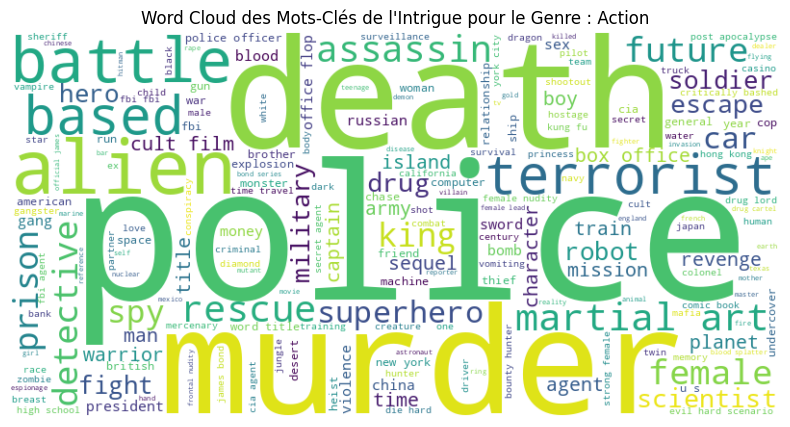

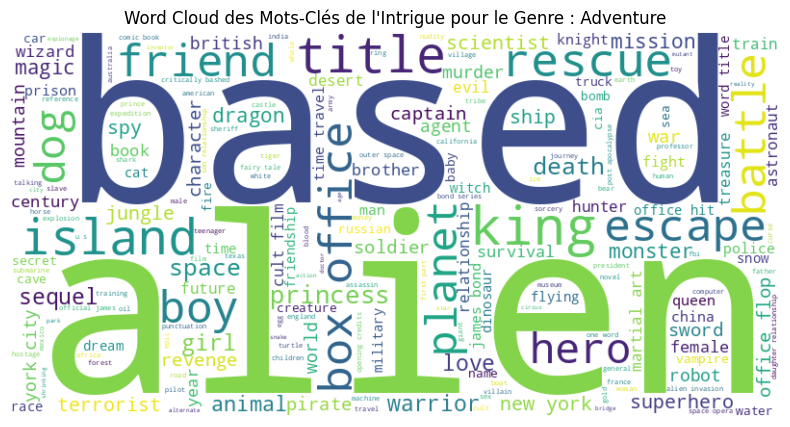

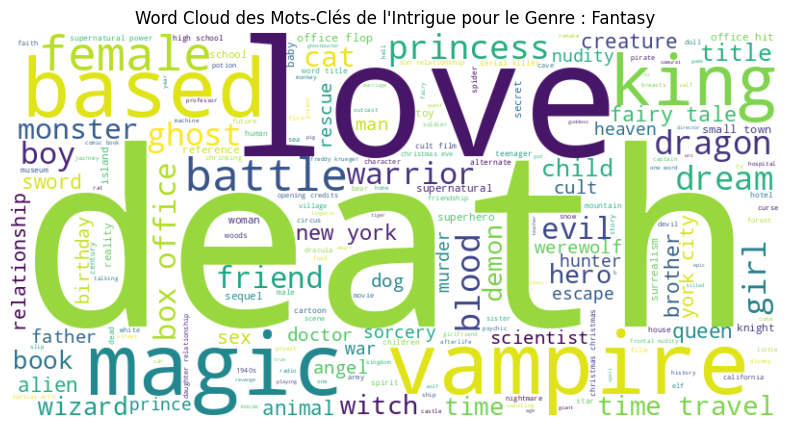

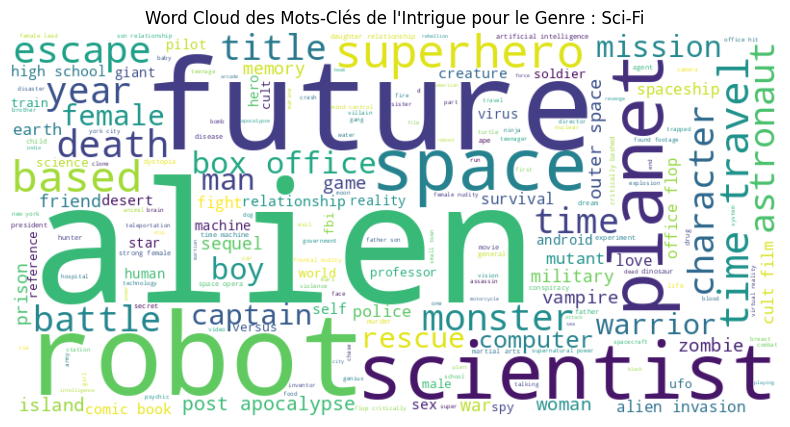

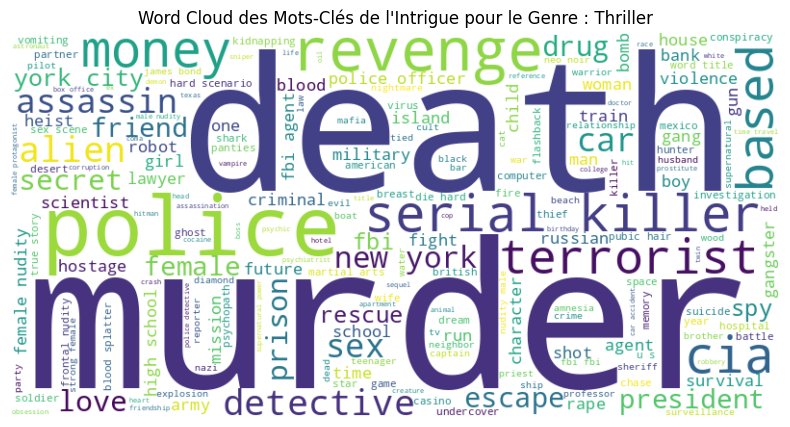

...

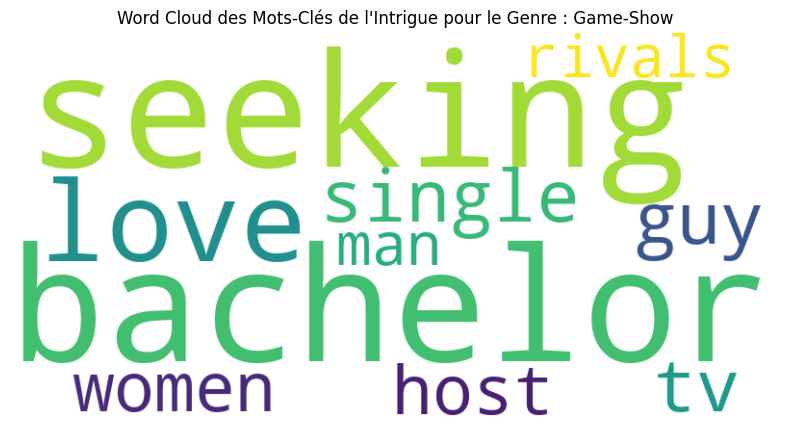

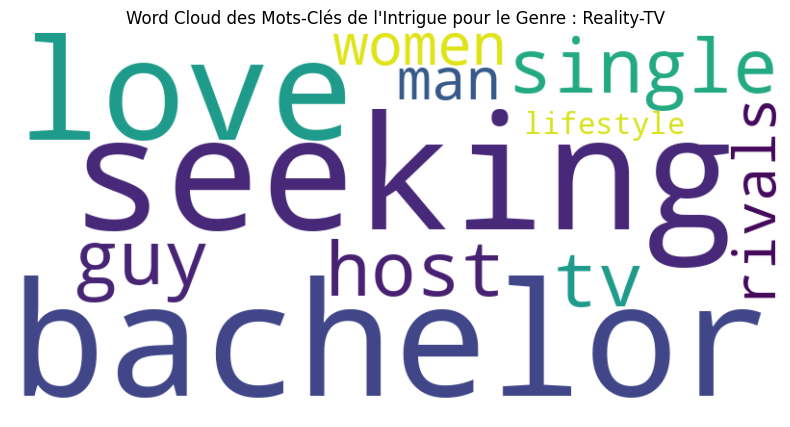

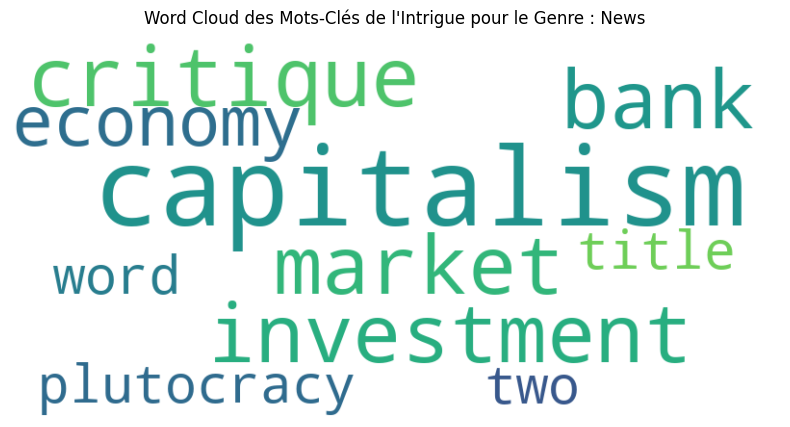

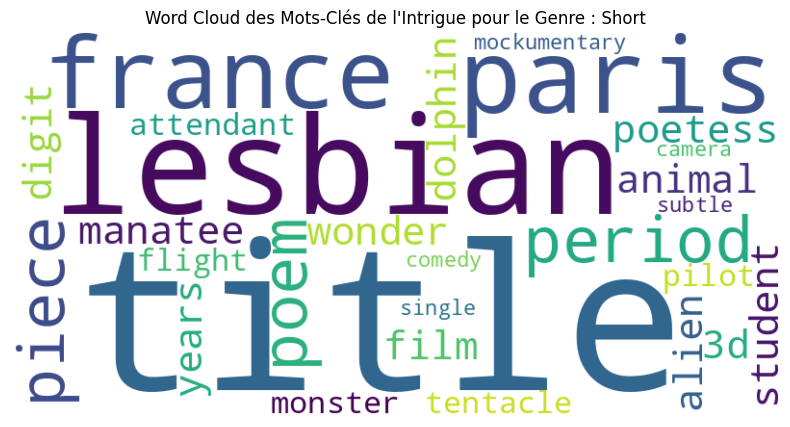

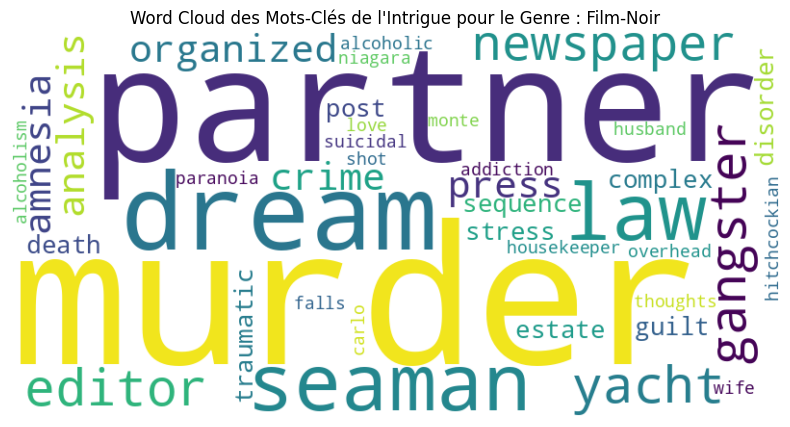

In [71]:
# Créez un DataFrame avec les colonnes 'genres' et 'plot_keywords'
genre_plot_keywords = df[['genres', 'plot_keywords']]

# Divisez les genres en listes
genre_plot_keywords['genres'] = genre_plot_keywords['genres'].str.split('|')

# Explosez le DataFrame pour avoir une ligne par genre
genre_plot_keywords = genre_plot_keywords.explode('genres')

# Créez un word cloud par genre
genres = genre_plot_keywords['genres'].unique()

for genre in genres:
    genre_keywords = ' '.join(genre_plot_keywords[genre_plot_keywords['genres'] == genre]['plot_keywords'].dropna())
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(genre_keywords)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud des Mots-Clés de l\'Intrigue pour le Genre : {genre}')
    plt.show()

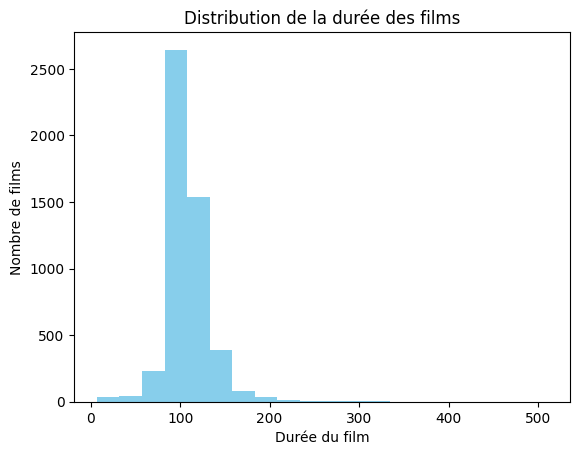

In [58]:
#Durée des films
plt.hist(df['duration'], bins=20, color='skyblue')
plt.xlabel('Durée du film')
plt.ylabel('Nombre de films')
plt.title('Distribution de la durée des films')
plt.show()

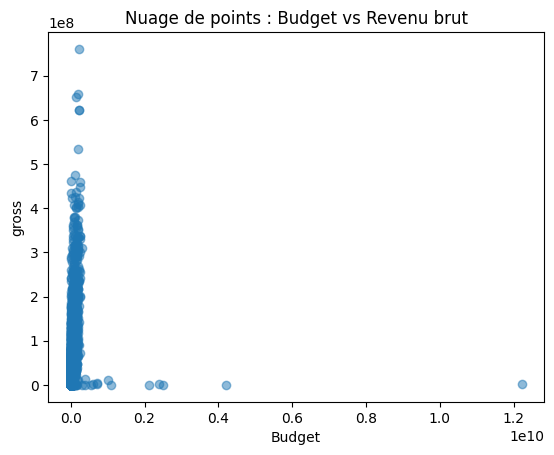

In [60]:
# lien entre budget et gross
plt.scatter(df['budget'], df['gross'], alpha=0.5)
plt.xlabel('Budget')
plt.ylabel('gross')
plt.title('Nuage de points : Budget vs gross')
plt.show()

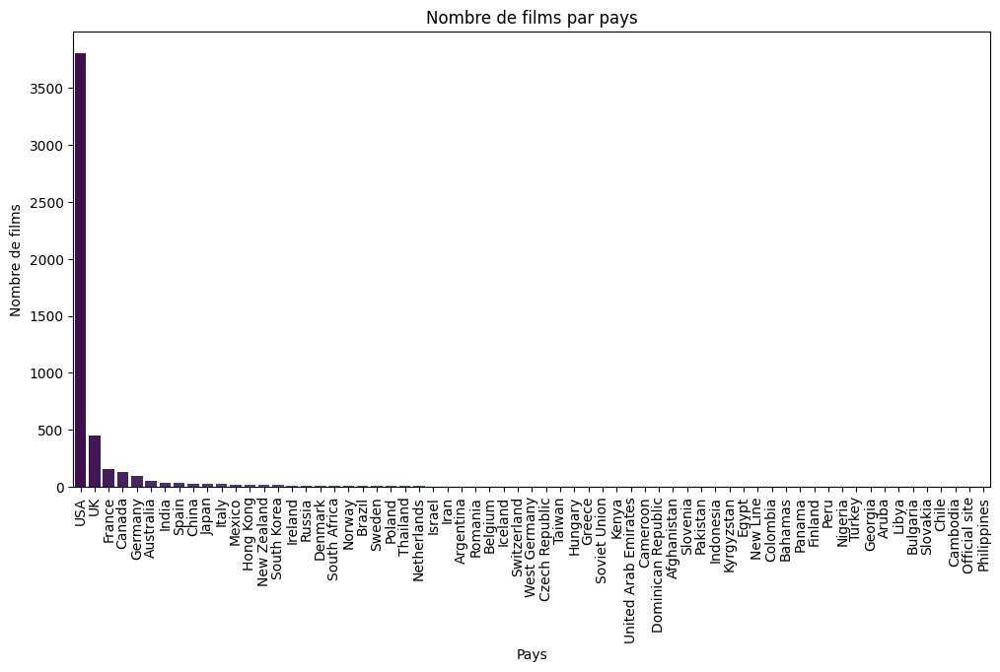

In [61]:
#repartition des films dans les pays
country_counts = df['country'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(x=country_counts.index, y=country_counts.values, palette='viridis')
plt.xlabel('Pays')
plt.ylabel('Nombre de films')
plt.title('Nombre de films par pays')
plt.xticks(rotation=90)
plt.show()

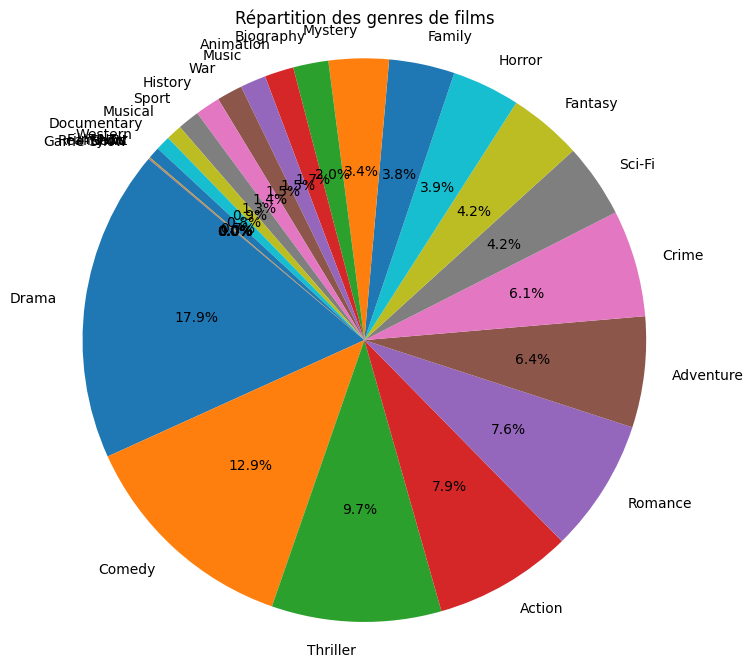

In [62]:
# % de genre present dans le dataset
genre_counts = df['genres'].str.split('|').explode().value_counts()
plt.figure(figsize=(8, 8))
plt.pie(genre_counts, labels=genre_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Répartition des genres de films')
plt.axis('equal')
plt.show()

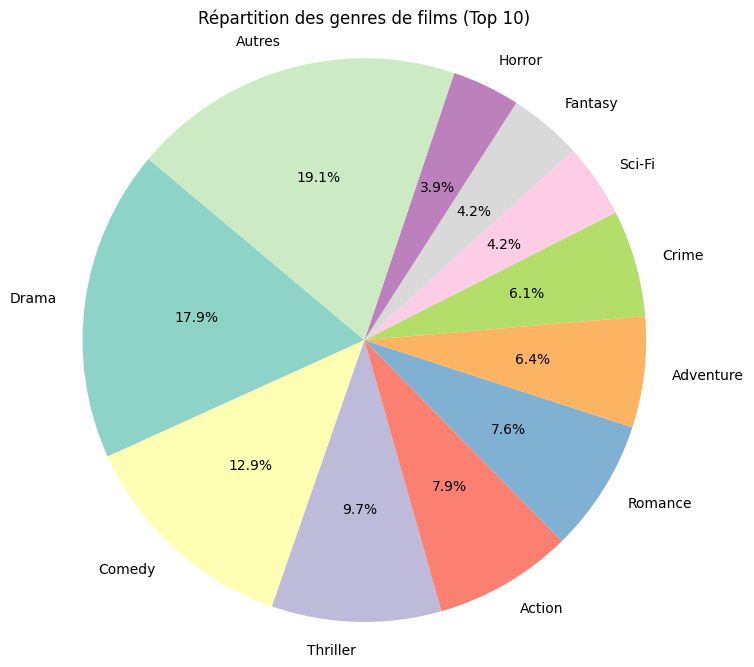

In [81]:
genre_counts = df['genres'].str.split('|').explode().value_counts()
top_genres = genre_counts.head(10)  # Sélectionnez les dix genres les plus courants

# Créez une liste de dictionnaires pour les dix genres les plus courants
top_genres_list = [{'Genre': genre, 'Count': count} for genre, count in zip(top_genres.index, top_genres.values)]

# Comptez les autres genres et ajoutez-les à un groupe "Autres"
other_count = genre_counts[10:].sum()
top_genres_list.append({'Genre': 'Autres', 'Count': other_count})

# Créez un DataFrame à partir de la liste de dictionnaires
top_genres_df = pd.DataFrame(top_genres_list)

# Utilisez la palette de couleurs "Set3" de Seaborn
colors = sns.color_palette("Set3")

# Créez un graphique circulaire avec les dix genres les plus courants et le groupe "Autres"
plt.figure(figsize=(8, 8))
plt.pie(top_genres_df['Count'], labels=top_genres_df['Genre'], autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('Répartition des genres de films (Top 10)')
plt.axis('equal')
plt.show()




In [11]:
df.columns

Index(['color', 'director_name', 'num_critic_for_reviews', 'duration',
       'director_facebook_likes', 'actor_3_facebook_likes', 'actor_2_name',
       'actor_1_facebook_likes', 'gross', 'genres', 'actor_1_name',
       'movie_title', 'num_voted_users', 'cast_total_facebook_likes',
       'actor_3_name', 'facenumber_in_poster', 'plot_keywords',
       'movie_imdb_link', 'num_user_for_reviews', 'language', 'country',
       'content_rating', 'budget', 'title_year', 'actor_2_facebook_likes',
       'imdb_score', 'aspect_ratio', 'movie_facebook_likes'],
      dtype='object')

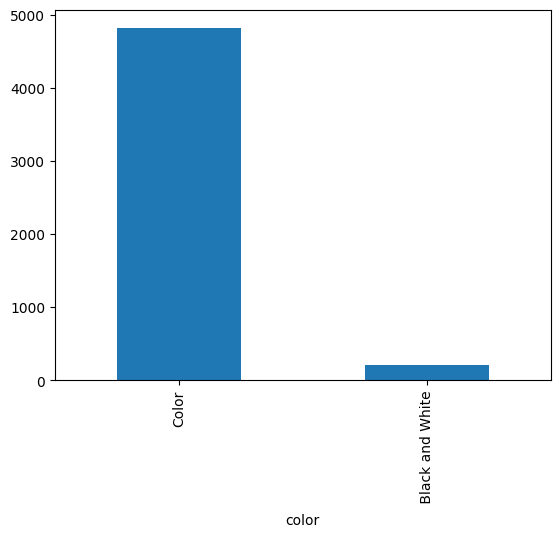

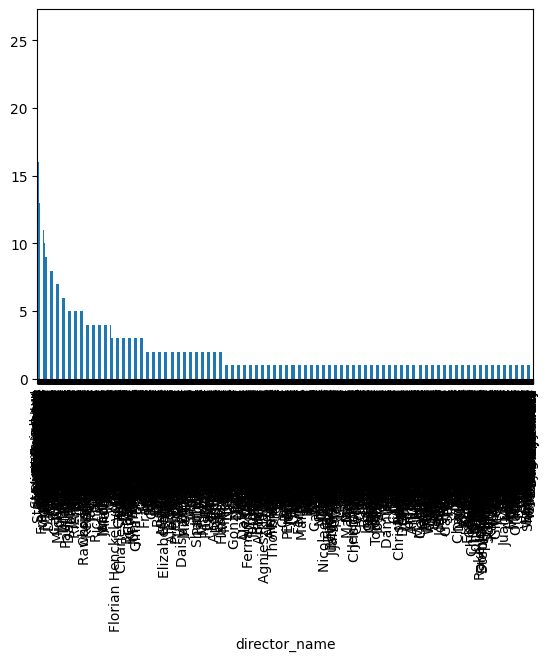

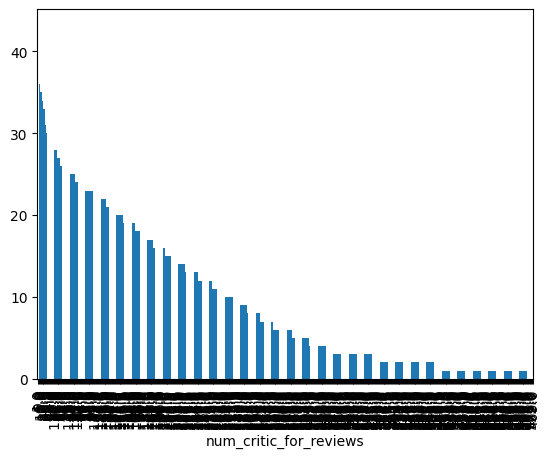

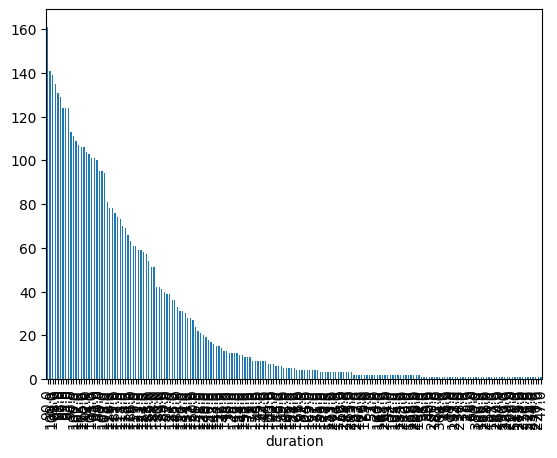

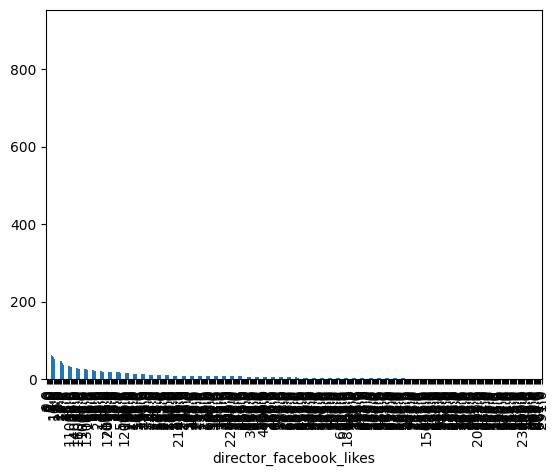

...

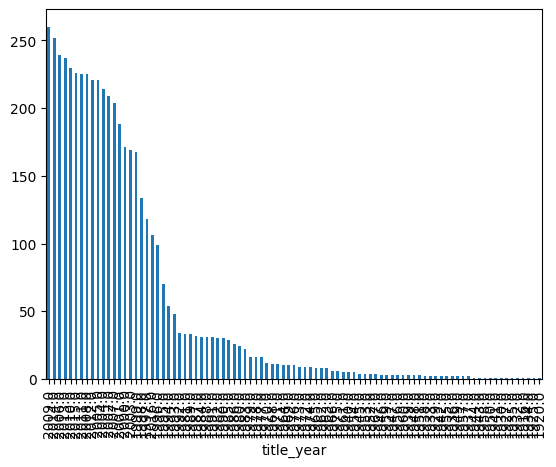

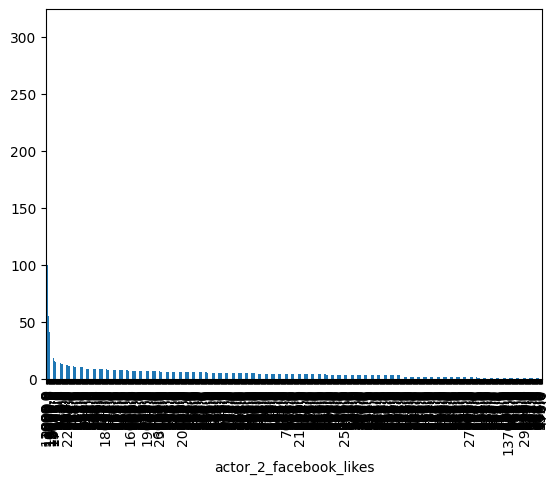

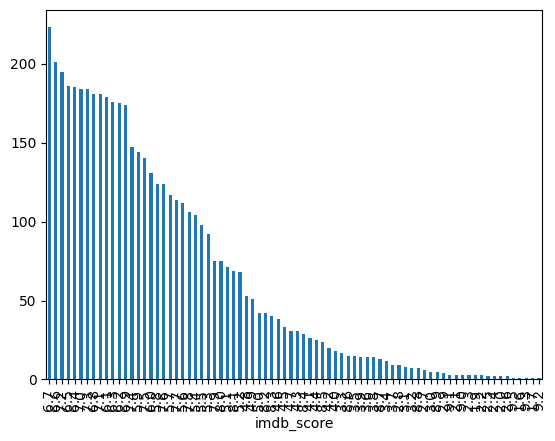

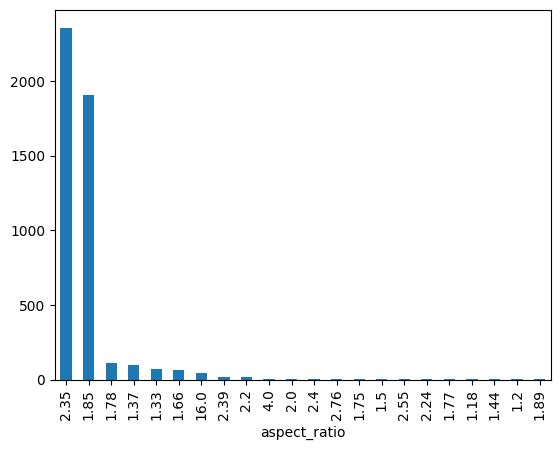

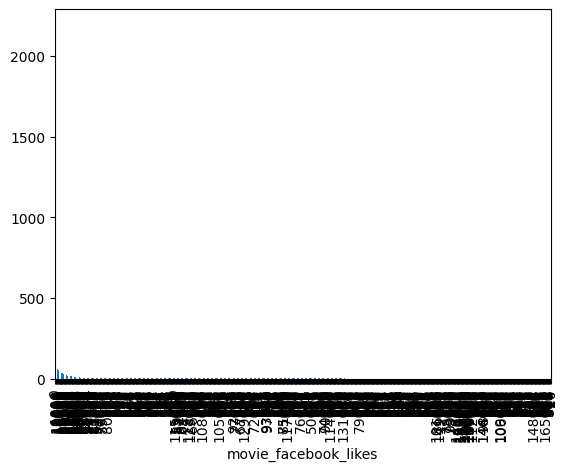

In [12]:
for col in df.columns:
    df[col].value_counts().plot(kind='bar')
    plt.show()

In [ ]:
df.content_rating.value_counts()

In [47]:
df.num_critic_for_reviews.value_counts()

num_critic_for_reviews
1.0      43
9.0      37
5.0      36
10.0     35
8.0      35
         ..
738.0     1
476.0     1
775.0     1
552.0     1
409.0     1
Name: count, Length: 528, dtype: int64

## Armonisation des content_rating

<Axes: xlabel='content_rating'>

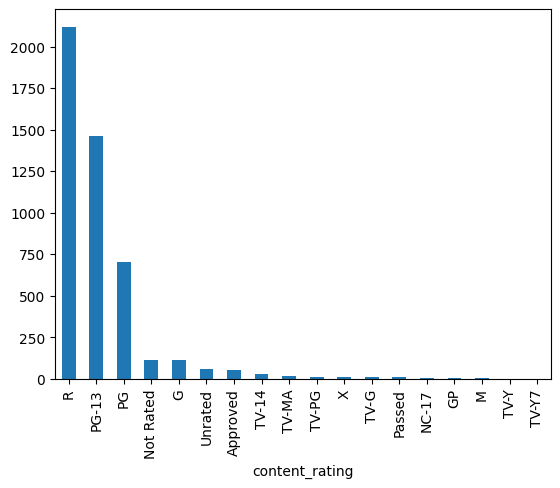

In [14]:
df.content_rating.value_counts().plot(kind='bar')

In [15]:
# General
df['content_rating'] = df['content_rating'].replace({"G": "general", "TV-G": "general", "Approved": "general", "GP": "general", "Passed": "general"})

# Children
df['content_rating'] = df['content_rating'].replace({"TV-Y": "children", "TV-Y7": "children"})

# Adult
df['content_rating'] = df['content_rating'].replace({"X": "adult", "NC-17": "adult", "M": "adult", "PG": "adult","TV-MA": "adult", "Unrated": "adult", "Not Rated": "adult", "TV-PG": "adult", "R": "adult"})

# Young adults
df['content_rating'] = df['content_rating'].replace({"PG-13": "young_adult", "TV-14": "young_adult"})

<Axes: xlabel='content_rating'>

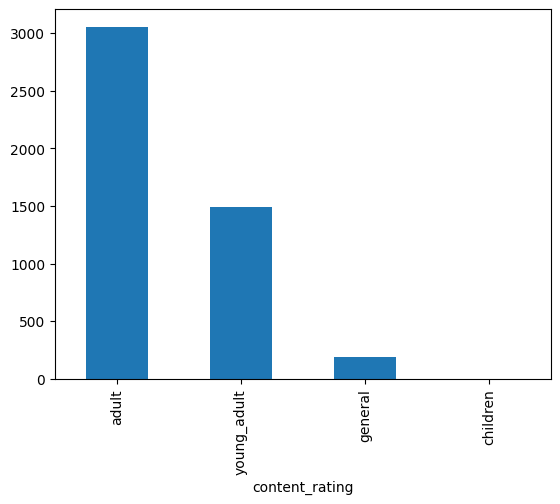

In [16]:
df.content_rating.value_counts().plot(kind='bar')

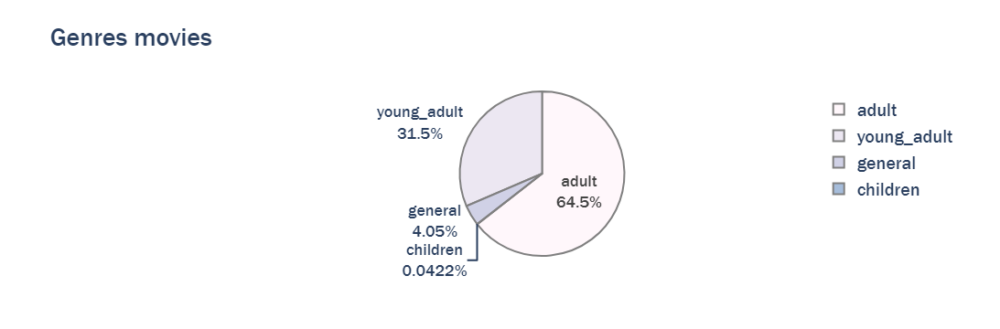

In [17]:
genre_movie = df['content_rating'].value_counts()
fig = px.pie(values=genre_movie.values, 
             names=genre_movie.index, 
             color_discrete_sequence=px.colors.sequential.PuBu,
             title= 'Genres movies')
fig.update_traces(textinfo='label+percent', textfont_size=18,
                  marker=dict(line=dict(color='#100000', width=0.2)))

fig.data[0].marker.line.width = 2
fig.data[0].marker.line.color='gray'
fig.update_layout(
    font=dict(size=20,family="Franklin Gothic"))
fig.show()

## Etude de la correlation entre des variables et la notation Imbd

In [53]:
num= df[['budget', 'gross', 'duration', 'imdb_score','num_critic_for_reviews','num_voted_users','title_year','aspect_ratio']]
num
corr_matrix = num.corr()
corr_matrix.style.background_gradient(cmap='coolwarm')

,budget,gross,duration,imdb_score,num_critic_for_reviews,num_voted_users,title_year,aspect_ratio
budget,1.000000,0.102179,0.074276,0.030688,0.119994,0.079621,0.045726,0.006598
gross,0.102179,1.000000,0.250298,0.198021,0.480601,0.637271,0.030886,0.069346
duration,0.074276,0.250298,1.000000,0.261662,0.258486,0.314765,-0.135038,-0.090071
imdb_score,0.030688,0.198021,0.261662,1.000000,0.305303,0.410965,-0.209167,0.059445
num_critic_for_reviews,0.119994,0.480601,0.258486,0.305303,1.000000,0.624943,0.275707,-0.049786
num_voted_users,0.079621,0.637271,0.314765,0.410965,0.624943,1.000000,0.007397,-0.014761
title_year,0.045726,0.030886,-0.135038,-0.209167,0.275707,0.007397,1.000000,0.159973
aspect_ratio,0.006598,0.069346,-0.090071,0.059445,-0.049786,-0.014761,0.159973,1.000000


In [18]:
df.columns

Index(['color', 'director_name', 'num_critic_for_reviews', 'duration',
       'director_facebook_likes', 'actor_3_facebook_likes', 'actor_2_name',
       'actor_1_facebook_likes', 'gross', 'genres', 'actor_1_name',
       'movie_title', 'num_voted_users', 'cast_total_facebook_likes',
       'actor_3_name', 'facenumber_in_poster', 'plot_keywords',
       'movie_imdb_link', 'num_user_for_reviews', 'language', 'country',
       'content_rating', 'budget', 'title_year', 'actor_2_facebook_likes',
       'imdb_score', 'aspect_ratio', 'movie_facebook_likes'],
      dtype='object')

## Etude de l'influence des notation FB 

In [38]:
rating= df[['director_name','director_facebook_likes',  'movie_title', 'movie_facebook_likes', 'actor_1_name','actor_1_facebook_likes','actor_2_name', 'actor_2_facebook_likes','actor_3_name','actor_3_facebook_likes','cast_total_facebook_likes','imdb_score']]
rating

,director_name,director_facebook_likes,movie_title,movie_facebook_likes,actor_1_name,actor_1_facebook_likes,actor_2_name,actor_2_facebook_likes,actor_3_name,actor_3_facebook_likes,cast_total_facebook_likes,imdb_score
0,James Cameron,0.0,Avatar,33000,CCH Pounder,1000.0,Joel David Moore,936.0,Wes Studi,855.0,4834,7.9
1,Gore Verbinski,563.0,Pirates of the Caribbean: At World's End,0,Johnny Depp,40000.0,Orlando Bloom,5000.0,Jack Davenport,1000.0,48350,7.1
2,Sam Mendes,0.0,Spectre,85000,Christoph Waltz,11000.0,Rory Kinnear,393.0,Stephanie Sigman,161.0,11700,6.8
3,Christopher Nolan,22000.0,The Dark Knight Rises,164000,Tom Hardy,27000.0,Christian Bale,23000.0,Joseph Gordon-Levitt,23000.0,106759,8.5
4,Doug Walker,131.0,Star Wars: Episode VII - The Force Awakens ...,0,Doug Walker,131.0,Rob Walker,12.0,NaN,NaN,143,7.1
...,...,...,...,...,...,...,...,...,...,...,...,...
5038,Scott Smith,2.0,Signed Sealed Delivered,84,Eric Mabius,637.0,Daphne Zuniga,470.0,Crystal Lowe,318.0,2283,7.7
5039,NaN,NaN,The Following,32000,Natalie Zea,841.0,Valorie Curry,593.0,Sam Underwood,319.0,1753,7.5
5040,Benjamin Roberds,0.0,A Plague So Pleasant,16,Eva Boehnke,0.0,Maxwell Moody,0.0,David Chandler,0.0,0,6.3
5041,Daniel Hsia,0.0,Shanghai Calling,660,Alan Ruck,946.0,Daniel Henney,719.0,Eliza Coupe,489.0,2386,6.3


<Axes: xlabel='director_name'>

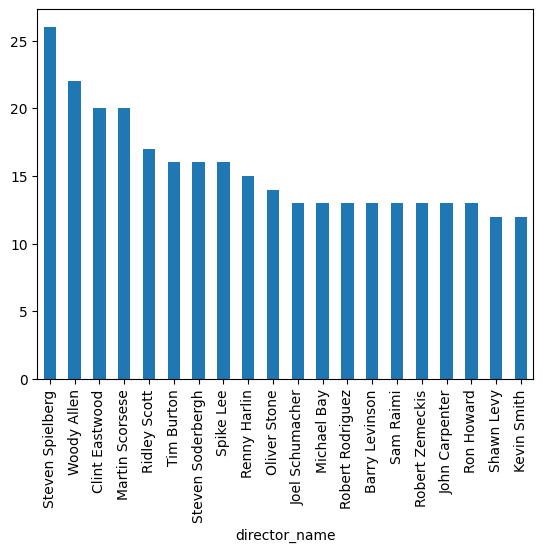

In [20]:
rating['director_name'].value_counts().head(20).plot(kind='bar')

<Axes: xlabel='actor_1_name'>

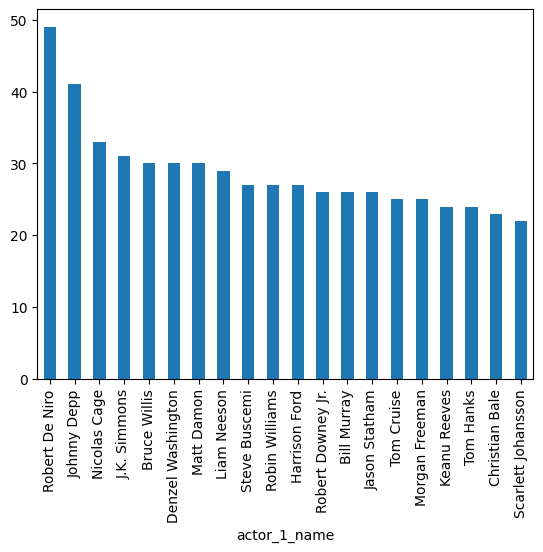

In [21]:
rating['actor_1_name'].value_counts().head(20).plot(kind='bar')

In [39]:
director_like = rating.sort_values(by='director_facebook_likes', ascending=False, na_position='last')
director_like 

,director_name,director_facebook_likes,movie_title,movie_facebook_likes,actor_1_name,actor_1_facebook_likes,actor_2_name,actor_2_facebook_likes,actor_3_name,actor_3_facebook_likes,cast_total_facebook_likes,imdb_score
3672,Joseph Gordon-Levitt,23000.0,Don Jon,33000,Joseph Gordon-Levitt,23000.0,Scarlett Johansson,19000.0,Tony Danza,694.0,44265,6.6
66,Christopher Nolan,22000.0,The Dark Knight,37000,Christian Bale,23000.0,Heath Ledger,13000.0,Morgan Freeman,11000.0,57802,9.0
97,Christopher Nolan,22000.0,Inception,175000,Leonardo DiCaprio,29000.0,Tom Hardy,27000.0,Joseph Gordon-Levitt,23000.0,81115,8.8
3716,Christopher Nolan,22000.0,Memento,40000,Callum Rennie,716.0,Thomas Lennon,651.0,Jorja Fox,379.0,1997,8.5
1066,Christopher Nolan,22000.0,Insomnia,0,Al Pacino,14000.0,Maura Tierney,509.0,Crystal Lowe,319.0,15658,7.2
...,...,...,...,...,...,...,...,...,...,...,...,...
4798,NaN,NaN,Heroes,0,Sendhil Ramamurthy,1000.0,Masi Oka,923.0,Greg Grunberg,833.0,4908,7.7
4803,NaN,NaN,Home Movies,526,Brendon Small,59.0,Ron Lynch,11.0,Melissa Bardin Galsky,6.0,81,8.2
4819,NaN,NaN,Revolution,17000,Billy Burke,2000.0,Tracy Spiridakos,821.0,David Lyons,576.0,5052,6.7
4869,NaN,NaN,Happy Valley,10000,Shirley Henderson,887.0,James Norton,340.0,Sarah Lancashire,250.0,2572,8.5


In [23]:
rating['actor_1_name'].head(20)

0            CCH Pounder
1            Johnny Depp
2        Christoph Waltz
3              Tom Hardy
4            Doug Walker
5           Daryl Sabara
6           J.K. Simmons
7           Brad Garrett
8        Chris Hemsworth
9           Alan Rickman
10          Henry Cavill
11          Kevin Spacey
12    Giancarlo Giannini
13           Johnny Depp
14           Johnny Depp
15          Henry Cavill
16        Peter Dinklage
17       Chris Hemsworth
18           Johnny Depp
19            Will Smith
Name: actor_1_name, dtype: object

In [24]:
director_like['actor_1_name'].head(20)

3672    Joseph Gordon-Levitt
66            Christian Bale
97         Leonardo DiCaprio
3716           Callum Rennie
1066               Al Pacino
96       Matthew McConaughey
1233          Christian Bale
3                  Tom Hardy
120           Christian Bale
364             Robin Wright
434        Robert Downey Jr.
683                Brad Pitt
1600          Morgan Freeman
866        Charles S. Dutton
1197         Andrew Garfield
101                Brad Pitt
715            Patrick Fugit
1043         Kristen Stewart
975       Deborah Kara Unger
4341            Kevin Zegers
Name: actor_1_name, dtype: object

In [25]:
rating['movie_title'].head(20)

0                                                Avatar
1              Pirates of the Caribbean: At World's End
2                                               Spectre
3                                 The Dark Knight Rises
4     Star Wars: Episode VII - The Force Awakens    ...
5                                           John Carter
6                                          Spider-Man 3
7                                               Tangled
8                               Avengers: Age of Ultron
9                Harry Potter and the Half-Blood Prince
10                   Batman v Superman: Dawn of Justice
11                                     Superman Returns
12                                    Quantum of Solace
13           Pirates of the Caribbean: Dead Man's Chest
14                                      The Lone Ranger
15                                         Man of Steel
16             The Chronicles of Narnia: Prince Caspian
17                                         The A

In [26]:
director_like['movie_title'].head(20)

3672                                Don Jon
66                          The Dark Knight
97                                Inception
3716                                Memento
1066                               Insomnia
96                             Interstellar
1233                           The Prestige
3                     The Dark Knight Rises
120                           Batman Begins
364         The Girl with the Dragon Tattoo
434                                  Zodiac
683                              Fight Club
1600                                  Se7en
866                                 Alien 3
1197                     The Social Network
101     The Curious Case of Benjamin Button
715                               Gone Girl
1043                             Panic Room
975                                The Game
4341             The Curse of Downers Grove
Name: movie_title, dtype: object

In [27]:
def histogram_plotly(df, x, *args, **kwargs ):
    '''pour utilisé le y et le hue il faut ecrire y= ou hue = '''
    y = kwargs.get('y', None)
    hue = kwargs.get('hue', None)
    if y!= None:
        fig = px.histogram(df, x= x, y = y, barmode='group')
    if hue!= None:
        fig = px.histogram(df, x= x, color = hue, barmode='group')
    if y!= None and hue!= None:
        fig = px.histogram(df, x= x, y=y, color = hue, barmode='group')

    fig.update_xaxes(type='category')
    fig.update_layout(bargap=0.2)
    fig.show()

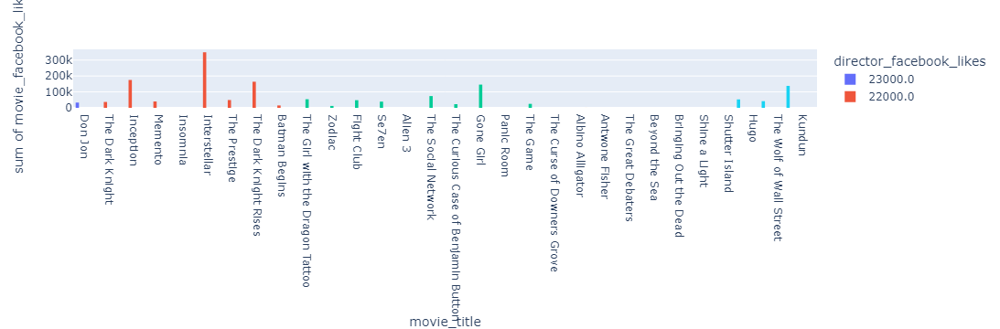

In [28]:
histogram_plotly(director_like.head(30), x='movie_title' , y= 'movie_facebook_likes' , hue= 'director_facebook_likes'  )

correlation entre les like du realisateur et si les like du film 

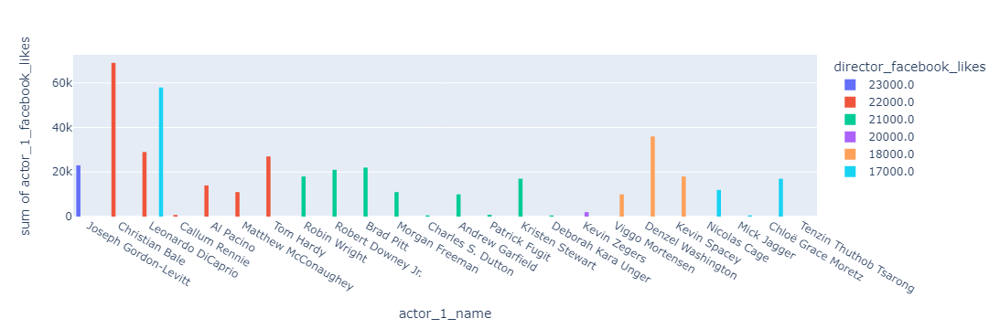

In [29]:
histogram_plotly(director_like.head(30), x='actor_1_name' , y= 'actor_1_facebook_likes' , hue= 'director_facebook_likes'  )

correlation entre les like des acteurs et si les like du film 

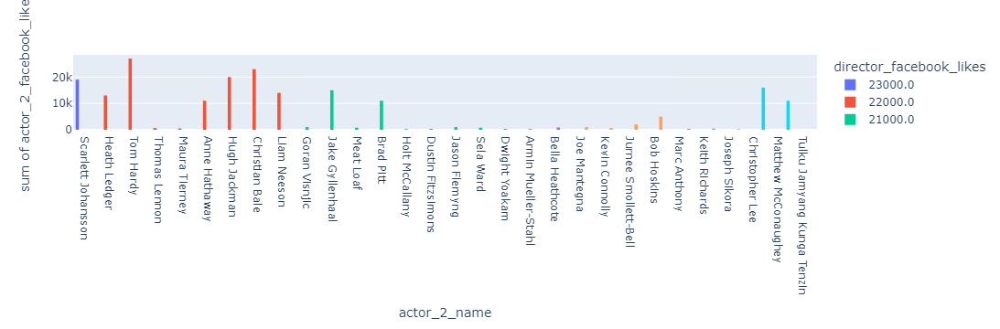

In [30]:
histogram_plotly(director_like.head(30), x='actor_2_name' , y= 'actor_2_facebook_likes' , hue= 'director_facebook_likes'  )

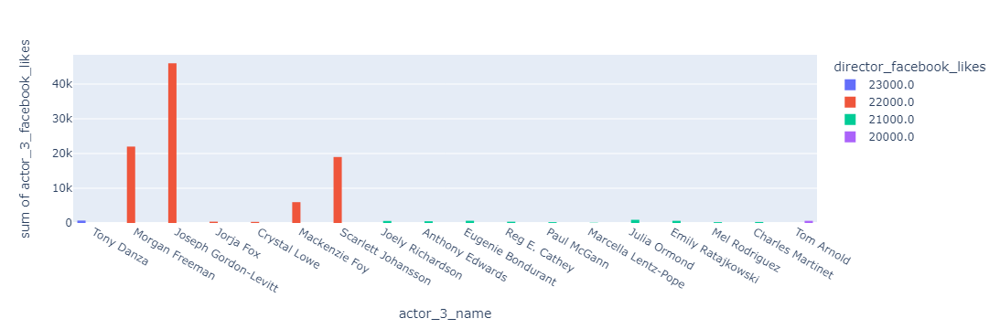

In [31]:
histogram_plotly(director_like.head(20), x='actor_3_name' , y= 'actor_3_facebook_likes' , hue= 'director_facebook_likes'  )

In [ ]:
#Le but des figures etait de voir s'il la notation facebook avait une influence sur la notation des film, pour mieux le voir utilisation d'une matrice de correlation 

In [ ]:
#correlation entre les like facbook

In [42]:
rating_cor= df[['director_facebook_likes', 'movie_facebook_likes', 'actor_1_facebook_likes', 'actor_2_facebook_likes','actor_3_facebook_likes','cast_total_facebook_likes','imdb_score']]
rating_cor
corr_matrix = rating_cor.corr()
corr_matrix.style.background_gradient(cmap='coolwarm')

,director_facebook_likes,movie_facebook_likes,actor_1_facebook_likes,actor_2_facebook_likes,actor_3_facebook_likes,cast_total_facebook_likes,imdb_score
director_facebook_likes,1.000000,0.162048,0.090723,0.119601,0.120199,0.119549,0.170802
movie_facebook_likes,0.162048,1.000000,0.135348,0.243487,0.278844,0.209786,0.247049
actor_1_facebook_likes,0.090723,0.135348,1.000000,0.390487,0.249927,0.951661,0.076099
actor_2_facebook_likes,0.119601,0.243487,0.390487,1.000000,0.559662,0.628404,0.083808
actor_3_facebook_likes,0.120199,0.278844,0.249927,0.559662,1.000000,0.473920,0.052633
cast_total_facebook_likes,0.119549,0.209786,0.951661,0.628404,0.473920,1.000000,0.085787
imdb_score,0.170802,0.247049,0.076099,0.083808,0.052633,0.085787,1.000000


In [32]:
rating_2= df[['director_name','director_facebook_likes',  'movie_title', 'movie_facebook_likes','imdb_score']]
rating_2

,director_name,director_facebook_likes,movie_title,movie_facebook_likes,imdb_score
0,James Cameron,0.0,Avatar,33000,7.9
1,Gore Verbinski,563.0,Pirates of the Caribbean: At World's End,0,7.1
2,Sam Mendes,0.0,Spectre,85000,6.8
3,Christopher Nolan,22000.0,The Dark Knight Rises,164000,8.5
4,Doug Walker,131.0,Star Wars: Episode VII - The Force Awakens ...,0,7.1
...,...,...,...,...,...
5038,Scott Smith,2.0,Signed Sealed Delivered,84,7.7
5039,NaN,NaN,The Following,32000,7.5
5040,Benjamin Roberds,0.0,A Plague So Pleasant,16,6.3
5041,Daniel Hsia,0.0,Shanghai Calling,660,6.3


In [33]:
imbd = rating_2.sort_values(by='imdb_score', ascending=False, na_position='last')
imbd

,director_name,director_facebook_likes,movie_title,movie_facebook_likes,imdb_score
2765,John Blanchard,0.0,Towering Inferno,0,9.5
1937,Frank Darabont,0.0,The Shawshank Redemption,108000,9.3
3466,Francis Ford Coppola,0.0,The Godfather,43000,9.2
4409,John Stockwell,134.0,Kickboxer: Vengeance,0,9.1
2824,NaN,NaN,Dekalog,0,9.1
...,...,...,...,...,...
2268,Jason Friedberg,82.0,Disaster Movie,0,1.9
2295,Bob Clark,84.0,Superbabies: Baby Geniuses 2,0,1.9
4605,A. Raven Cruz,0.0,The Helix... Loaded,128,1.9
1136,Lawrence Kasanoff,11.0,Foodfight!,0,1.7


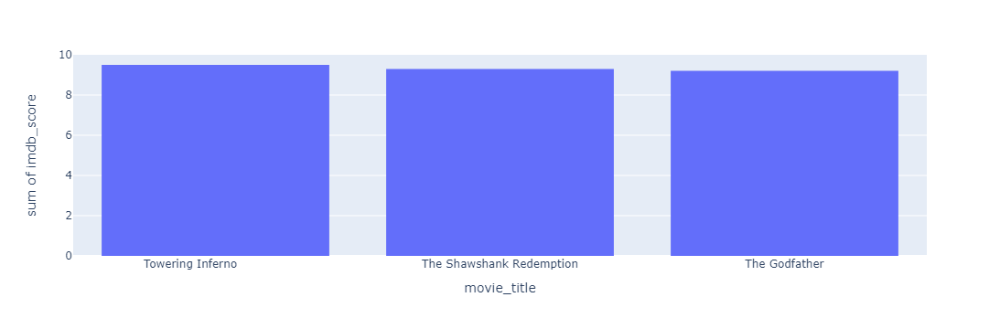

In [41]:
# top 3 meilleur note imbd
histogram_plotly(imbd.head(3), x='movie_title' , y= 'imdb_score' )

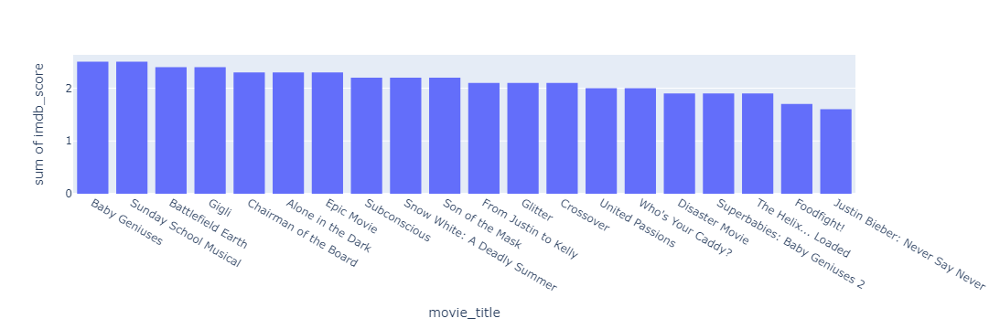

In [37]:
# 20 film les moins bien noté
histogram_plotly(imbd.tail(20), x='movie_title' , y= 'imdb_score' )

In [ ]:
#repartition des label

<Axes: xlabel='imdb_score'>

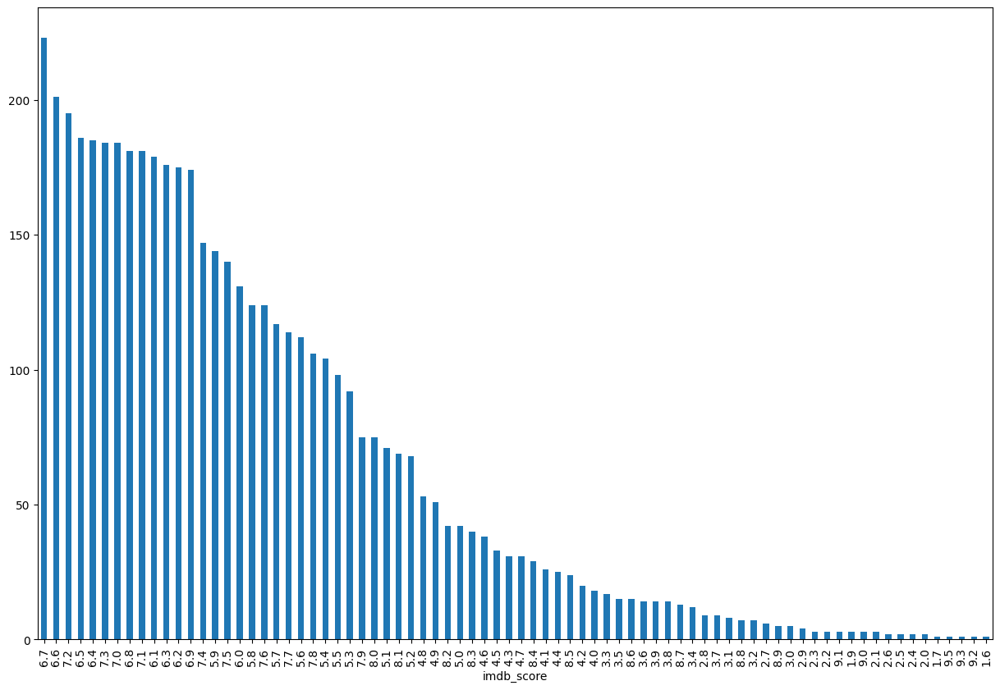

In [46]:
plt.figure(figsize=(15,10))
imbd['imdb_score'].value_counts().plot(kind='bar')

## Iteration 1

In [83]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel


df = df[['movie_title', 'genres', 'imdb_score']]

# Supprime les lignes avec des valeurs manquantes
df = df.dropna()

# Utilisation un vecteur TF-IDF pour les genres
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(df['genres'])

# Calcule la similarité cosinus entre les films en fonction des genres
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

# Crée une série d'index de films
indices = pd.Series(df.index, index=df['movie_title'])

# Crée une fonction pour recommander des films similaires
def recommend_movies(movie_title, num_recommendations=5):
    # Trouve l'index du film donné
    idx = indices[movie_title]

    # Obtient les scores de similarité cosinus pour tous les films
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Trie les films en fonction des scores de similarité
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Sélectionne les premiers num_recommendations films (à l'exception du film de référence)
    sim_scores = sim_scores[1:num_recommendations + 1]

    # Obtiens les indices des films recommandés
    movie_indices = [i[0] for i in sim_scores]

    # Retourne les titres des films recommandés
    return df['movie_title'].iloc[movie_indices]

# Exemple d'utilisation : recommandez 5 films similaires à "Avatar"
user_movie = 'Avatar'
recommendations = recommend_movies(user_movie)
print(recommendations)


15                                     Man of Steel
39                         The Amazing Spider-Man 2
236    Star Wars: Episode III - Revenge of the Sith
237    Star Wars: Episode II - Attack of the Clones
240       Star Wars: Episode I - The Phantom Menace
Name: movie_title, dtype: object


## Iteration 2

In [103]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from fuzzywuzzy import fuzz, process


df = df[['movie_title', 'genres', 'imdb_score']]

# del les lignes avec des valeurs manquantes
df = df.dropna()

# Utilise un vecteur TF-IDF pour les genres
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(df['genres'])

# Calcule la similarité cosinus entre les films en fonction des genres
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

# Crée une série d'index de films
indices = pd.Series(df.index, index=df['movie_title'])

# Fonction pour calculer la distance de Levenshtein
def levenshtein_distance(s1, s2):
    if len(s1) < len(s2):
        return levenshtein_distance(s2, s1)

    if len(s2) == 0:
        return len(s1)

    previous_row = range(len(s2) + 1)
    for i, c1 in enumerate(s1):
        current_row = [i + 1]
        for j, c2 in enumerate(s2):
            insertions = previous_row[j + 1] + 1
            deletions = current_row[j] + 1
            substitutions = previous_row[j] + (c1 != c2)
            current_row.append(min(insertions, deletions, substitutions))
        previous_row = current_row

    return previous_row[-1]

# Fonction pour recommander des films en tenant compte des fautes de frappe
def recommend_movies(movie_title, num_recommendations=5, threshold=3):
    best_match = None
    best_distance = float('inf')

    for title in df['movie_title']:
        distance = levenshtein_distance(movie_title, title)
        if distance < best_distance and distance <= threshold:
            best_match = title
            best_distance = distance

    if best_match is None:
        return "Aucune correspondance trouvée. Veuillez essayer avec un autre titre de film."

    #l'index du film correspondant
    idx = indices[best_match]

    # scores de similarité cosinus pour tous les films
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Trie les films en fonction des scores de similarité
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Exclue le film correspondant de la liste des recommandations
    sim_scores = [x for x in sim_scores if x[0] != idx]

    # Sélectionne les premiers num_recommendations films
    sim_scores = sim_scores[:num_recommendations]

    # Obtien les indices des films recommandés
    movie_indices = [i[0] for i in sim_scores]

    # Retourne les titres des films recommandés
    return df['movie_title'].iloc[movie_indices]

# Exemple d'utilisation : recommandez 5 films similaires à "Avatare" (avec une faute d'orthographe)
user_movie = 'Avatare'  # Notez la faute d'orthographe
recommendations = recommend_movies(user_movie)
print(recommendations)



15                                     Man of Steel
39                         The Amazing Spider-Man 2
236    Star Wars: Episode III - Revenge of the Sith
237    Star Wars: Episode II - Attack of the Clones
240       Star Wars: Episode I - The Phantom Menace
Name: movie_title, dtype: object


In [105]:
user_movie = 'ponyoe'
recommendations = recommend_movies(user_movie)
print(recommendations)


91             The Polar Express
93      How to Train Your Dragon
156        Rise of the Guardians
304                         Epic
503    Arthur and the Invisibles
Name: movie_title, dtype: object


## Iteration 3

In [114]:
df_final= df[['color', 'num_critic_for_reviews', 'duration', 'gross', 'genres','movie_title', 'num_voted_users',  'plot_keywords', 'num_user_for_reviews', 'language', 'country',
       'content_rating', 'budget', 'title_year','imdb_score', 'aspect_ratio']]

In [56]:
percent_missing = df_final.isnull().sum() * 100 / len(df_final)
missing_value_df = pd.DataFrame({'percent_missing': percent_missing})
missing_value_df 

,percent_missing
color,0.376760
num_critic_for_reviews,0.991473
duration,0.297442
gross,17.529248
genres,0.000000
movie_title,0.000000
num_voted_users,0.000000
plot_keywords,3.033908
num_user_for_reviews,0.416419
language,0.277613


In [109]:
df_final.columns

Index(['color', 'num_critic_for_reviews', 'duration', 'gross', 'genres',
       'movie_title', 'num_voted_users', 'plot_keywords',
       'num_user_for_reviews', 'language', 'country', 'content_rating',
       'budget', 'title_year', 'imdb_score', 'aspect_ratio'],
      dtype='object')

In [110]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5043 entries, 0 to 5042
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   color                   5024 non-null   object 
 1   num_critic_for_reviews  4993 non-null   float64
 2   duration                5028 non-null   float64
 3   gross                   4159 non-null   float64
 4   genres                  5043 non-null   object 
 5   movie_title             5043 non-null   object 
 6   num_voted_users         5043 non-null   int64  
 7   plot_keywords           4890 non-null   object 
 8   num_user_for_reviews    5022 non-null   float64
 9   language                5029 non-null   object 
 10  country                 5038 non-null   object 
 11  content_rating          4740 non-null   object 
 12  budget                  4551 non-null   float64
 13  title_year              4935 non-null   float64
 14  imdb_score              5043 non-null   

In [116]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from fuzzywuzzy import fuzz, process

# del les lignes avec des valeurs manquantes
df_final = df_final.dropna()

# Utilisez un vecteur TF-IDF pour les genres
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(df_final['color']+ ' ' + df_final['genres']+ ' ' + df_final['plot_keywords']+ ' ' + df_final['language']+ ' ' + df_final['country']+ ' ' + df_final['content_rating'])

# Calculez la similarité cosinus entre les films en fonction des genres
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

# Créez une série d'index de films
indices = pd.Series(df_final.index, index=df_final['movie_title'])

# Fonction pour calculer la distance de Levenshtein
def levenshtein_distance(s1, s2):
    if len(s1) < len(s2):
        return levenshtein_distance(s2, s1)

    if len(s2) == 0:
        return len(s1)

    previous_row = range(len(s2) + 1)
    for i, c1 in enumerate(s1):
        current_row = [i + 1]
        for j, c2 in enumerate(s2):
            insertions = previous_row[j + 1] + 1
            deletions = current_row[j] + 1
            substitutions = previous_row[j] + (c1 != c2)
            current_row.append(min(insertions, deletions, substitutions))
        previous_row = current_row

    return previous_row[-1]

# Fonction pour recommander des films en tenant compte des fautes de frappe
def recommend_movies(movie_title, num_recommendations=5, threshold=3):
    best_match = None
    best_distance = float('inf')

    for title in df['movie_title']:
        distance = levenshtein_distance(movie_title, title)
        if distance < best_distance and distance <= threshold:
            best_match = title
            best_distance = distance

    if best_match is None:
        return "Aucune correspondance trouvée. Veuillez essayer avec un autre titre de film."

    #l'index du film correspondant
    idx = indices[best_match]

    # scores de similarité cosinus pour tous les films
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Trie les films en fonction des scores de similarité
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Exclue le film correspondant de la liste des recommandations
    sim_scores = [x for x in sim_scores if x[0] != idx]

    # Sélectionne les premiers num_recommendations films
    sim_scores = sim_scores[:num_recommendations]

    # Obtien les indices des films recommandés
    movie_indices = [i[0] for i in sim_scores]

    # Retourne les titres des films recommandés
    return df_final['movie_title'].iloc[movie_indices]

# Exemple d'utilisation : recommandez 5 films similaires à "Avatare" (avec une faute d'orthographe)
user_movie = 'Avatare'  # Notez la faute d'orthographe
recommendations = recommend_movies(user_movie)
print(recommendations)



140     The Last Airbender 
601     Battle Los Angeles 
4264         Smoke Signals 
491             Surrogates 
1441               In Time 
Name: movie_title, dtype: object


In [118]:
# Exemple d'utilisation : recommandez 5 films similaires à "Avatare" (avec une faute d'orthographe)
user_movie = 'kill bill'  # Notez la faute d'orthographe
recommendations = recommend_movies(user_movie)
print(recommendations)

Aucune correspondance trouvée. Veuillez essayer avec un autre titre de film.


In [120]:
# Exemple d'utilisation : recommandez 5 films similaires à "Avatare" (avec une faute d'orthographe)
user_movie = "Pirates of the Caribbean: At World's End"  # Notez la faute d'orthographe
recommendations = recommend_movies(user_movie)
print(recommendations)

3926        Love Stinks 
2708          Boat Trip 
2445        Being Julia 
4490    Monsoon Wedding 
1618       Hope Springs 
Name: movie_title, dtype: object


In [ ]:
#ne semble pas etre hyper pertinant, la version precedente avec moins de colonnes semblait plus interessante il faudrait faire de la feature importance 